# Day-by-Day Sales Forecasting
## Managerial Decision Making and Modelling

Project Work by Marco Bruttocao, 858067@stud.unive.it
Ca' Foscari University, Venice

> File `POSdata.csv` reports the data on products A, B, C, D sales in 46
different 24/365 point of sales (POS) between October 2036 and November 2037.

<br>

Each record has the following seven fields:

 - `DateTime`: purchase time (YYYY-MM-DD-hh.mm.ss, e.g., 2038-12-01-02.31.05
    means that someone purchased some products on December 2038, 1st at 2:31:05)

 - `PointOfSale`: point of sale unique identifier

 - `Error`: error-detecting code. If it is equal to 1, incorrect data has been
    recorded, and the record should be disregarded

 - `ProductA`: number of products A sold

 - `ProductB`: number of products B sold

 - `ProductC`: number of products C sold

 - `ProductD`: number of products D sold

<br>

Products A, B, C, D are perishable the products unsold at midnight must be
disposed.

Each POS must reorder the products each day at 18:00, and they become available
at the POS a 00:00:01 of the next day. As an example, if a POS orders 20
products A on August 2036, 20th, it will receive the 20 products on August 2036,
21st at 00.00.01.

Each POS sells products A, B, C, D for 50.00, 20.00, 100.00, 10.00 euro per unit
respectively and purchase them from its supplier for 37.00, 15.00, 70.00, 8.00
euro respectively.

The supplier pays 30.00, 10.00, 50.00, 7.00 euro to make a unit of product
A, B, C, D respectively.

### Libraries and Settings

In [1]:
import IPython
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots


### Data Cleaning

In [2]:
pos = pd.read_csv("./Data/PosData.csv", sep = ";")
pos.DateTime = pd.to_datetime(pos.DateTime, format = '%Y-%m-%d-%H.%M.%S')
clean_pos = pos[pos.Error != 1].drop("Unnamed: 7", axis = 1)

print("Deleted rows: ", len(pos) - len(clean_pos))
clean_pos

Deleted rows:  2776


,DateTime,PointOfSale,Error,ProductA,ProductB,ProductC,ProductD
0,2036-10-02 00:35:00,101,0,3,5,0,0
1,2036-10-02 08:06:00,101,0,2,5,0,0
2,2036-10-02 08:40:00,101,0,3,5,0,0
3,2036-10-02 08:47:00,101,0,3,5,0,0
4,2036-10-02 08:53:00,101,0,3,5,0,0
...,...,...,...,...,...,...,...
647318,2037-11-28 19:06:00,9203,0,1,0,0,0
647319,2037-11-28 20:40:00,9203,0,1,0,0,0
647320,2037-11-29 00:32:00,9203,0,0,5,0,0
647321,2037-11-29 10:06:00,9203,0,1,0,0,0


In [3]:
l = []
for el in set(clean_pos.PointOfSale):
    el=str(el)
    l.append(el)
l.sort()

print("We have ", len(set(clean_pos.PointOfSale)), " different points of sales. \n")
print("Point of sales IDs:", "\n",
      IPython.utils.text.columnize(l, separator="', '"), sep="")


We have  46  different points of sales. 

Point of sales IDs:
101 ', '2031', '4601', '5060', '5150', '5300', '5400', '5501', '6601', '9203
105 ', '2301', '5011', '5080', '5160', '5320', '5410', '5801', '7001
107 ', '2501', '5020', '5110', '5180', '5350', '5420', '6001', '7201
1501', '2505', '5040', '5120', '5190', '5360', '5430', '6201', '8540
1801', '3501', '5041', '5140', '5241', '5390', '5440', '6502', '8550



### Grouping Products by day and PoS

In [4]:
grouped_pos = clean_pos.groupby([clean_pos['DateTime'].dt.floor('d'), clean_pos['PointOfSale']]).sum()
grouped_pos.reset_index(inplace=True)
grouped_pos

,DateTime,PointOfSale,Error,ProductA,ProductB,ProductC,ProductD
0,2036-10-02,101,0,216,174,0,0
1,2036-10-02,105,0,8,13,0,0
2,2036-10-02,107,0,72,168,0,0
3,2036-10-02,1501,0,294,0,0,0
4,2036-10-02,1801,0,57,119,0,0
...,...,...,...,...,...,...,...
19003,2037-11-29,7001,0,112,285,0,0
19004,2037-11-29,7201,0,30,115,0,0
19005,2037-11-29,8540,0,18,40,0,0
19006,2037-11-29,8550,0,4,10,0,0


### Product A

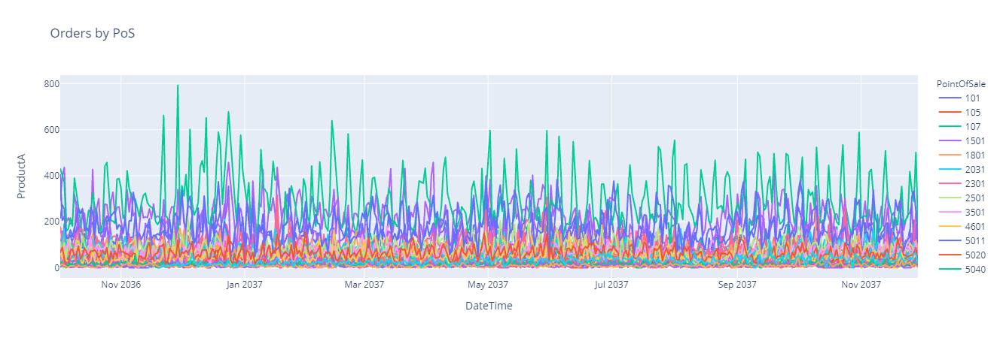

In [5]:
fig1 = px.line(grouped_pos, x = "DateTime", y = "ProductA",
             color = "PointOfSale",
              title="Orders by PoS")
fig1.show()

### Product B

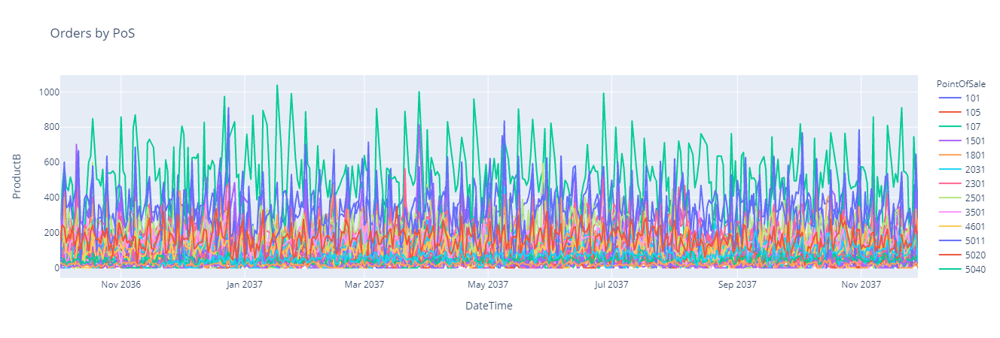

In [6]:
fig2 = px.line(grouped_pos, x = "DateTime", y = "ProductB",
             color = "PointOfSale",
              title="Orders by PoS")
fig2.show()

### Product C

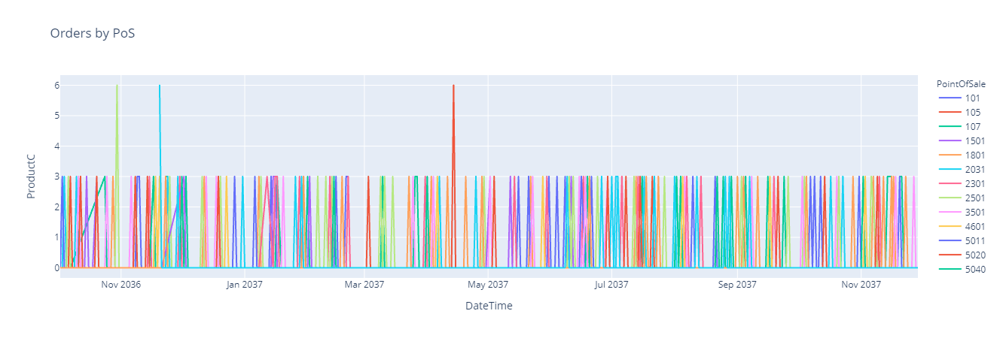

In [7]:
fig3 = px.line(grouped_pos, x = "DateTime", y = "ProductC",
             color = "PointOfSale",
              title="Orders by PoS")
fig3.show()

### Product D

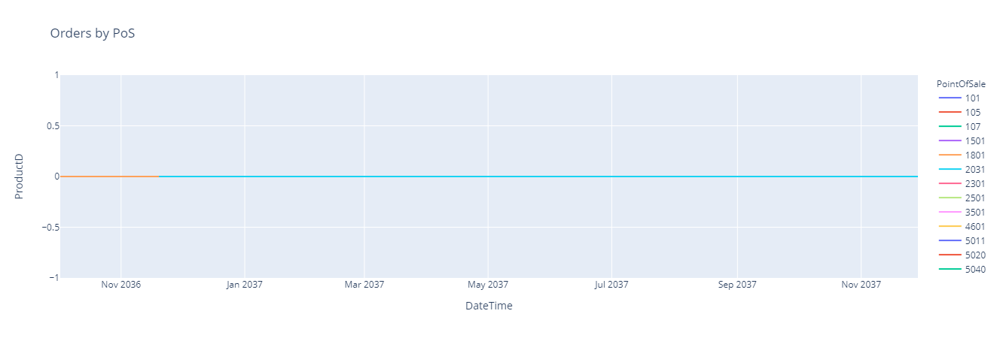

In [8]:
fig4 = px.line(grouped_pos, x = "DateTime", y = "ProductD",
             color = "PointOfSale",
              title="Orders by PoS")
fig4.show()